In [13]:
import os
from pathlib import Path
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms

from tqdm.auto import tqdm
from sklearn.manifold import TSNE
import random
import matplotlib.pyplot as plt


In [14]:
class FootprintPatchDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = Path(root_dir)
        self.transform = transform

        self.image_paths = []
        self.labels = []
        self.class_to_idx = {}
        self.idx_to_class = []

        for class_idx, class_name in enumerate(sorted(os.listdir(self.root_dir))):
            class_path = self.root_dir / class_name
            if not class_path.is_dir():
                continue

            self.class_to_idx[class_name] = class_idx
            self.idx_to_class.append(class_name)

            for fname in os.listdir(class_path):
                if fname.lower().endswith((".jpg", ".jpeg", ".png")):
                    self.image_paths.append(class_path / fname)
                    self.labels.append(class_idx)

        print(f"Loaded {len(self.image_paths)} images "
              f"from {self.root_dir}, {len(self.idx_to_class)} classes.")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path).convert("RGB")

        if self.transform is not None:
            image = self.transform(image)

        return image, label

In [15]:
class FootprintEncoder(nn.Module):
    def __init__(self, feature_dim=256):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 32, 3, 1, 1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, 3, 1, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(64, 128, 3, 1, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 256, 3, 1, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1))
        )
        self.fc = nn.Linear(256, feature_dim)
        self.out_dim = feature_dim

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)

class BackboneEncoder(nn.Module):
    """
    Wrap torchvision backbones to output a feature vector h.
    Supports: resnet50, vgg16, vit_b_16
    """
    def __init__(self, name="resnet50", pretrained=True):
        super().__init__()
        self.name = name

        if name == "resnet50":
            m = models.resnet50(weights=models.ResNet50_Weights.DEFAULT if pretrained else None)
            self.backbone = nn.Sequential(*list(m.children())[:-1])  # remove fc
            self.out_dim = 2048

        elif name == "vgg16":
            m = models.vgg16(weights=models.VGG16_Weights.DEFAULT if pretrained else None)
            self.backbone = m.features
            self.pool = nn.AdaptiveAvgPool2d((7, 7))
            # VGG classifier input is 512*7*7
            self.out_dim = 512 * 7 * 7

        elif name == "vit_b_16":
            m = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT if pretrained else None)
            # remove classification head
            m.heads = nn.Identity()
            self.backbone = m
            self.out_dim = 768

        else:
            raise ValueError(f"Unknown backbone name: {name}")

    def forward(self, x):
        if self.name == "resnet50":
            h = self.backbone(x)           # (B, 2048, 1, 1)
            h = h.flatten(1)               # (B, 2048)
            return h

        elif self.name == "vgg16":
            h = self.backbone(x)           # (B, 512, H, W)
            h = self.pool(h)               # (B, 512, 7, 7)
            h = h.flatten(1)               # (B, 25088)
            return h

        elif self.name == "vit_b_16":
            h = self.backbone(x)           # (B, 768)
            return h

# Projector & Text encoder

class ImageProjector(nn.Module):
    def __init__(self, in_dim, out_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, in_dim),
            nn.ReLU(inplace=True),
            nn.Linear(in_dim, out_dim)
        )
    def forward(self, x):
        return self.net(x)

class TextTokenEncoder(nn.Module):
    """
    Simple text token encoder using an embedding layer.
    take class ID as text token input , no species name
    """
    def __init__(self, num_classes, out_dim=128):
        super().__init__()
        self.embedding = nn.Embedding(num_classes, out_dim)

    def forward(self, labels):
        return self.embedding(labels)

In [16]:
PATCH_ROOT = Path("/users/PAS2985/tingle9/dataset/footprint_patches")
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

def get_eval_transform(backbone: str):
    """
      - cnn: 128, ToTensor
      - resnet/vgg: 128, ToTensor + normalize
      - vit: 224, ToTensor + normalize
    """
    
    if backbone == "cnn":
        img_size = 128
        return transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
        ])
    else:
        if backbone == "vit_b_16":
            img_size = 224
        else:
            img_size = 128

        return transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
        ])

def build_loaders(backbone: str, batch_size=64, num_workers=4):
    tfm = get_eval_transform(backbone)

    train_ds = FootprintPatchDataset(PATCH_ROOT / "train", transform=tfm)
    test_ds  = FootprintPatchDataset(PATCH_ROOT / "test",  transform=tfm)

    num_classes = len(train_ds.idx_to_class)

    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
    )
    test_loader = DataLoader(
        test_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
    )
    return train_ds, test_ds, train_loader, test_loader, num_classes

def load_contrastive_encoder_for_eval(backbone: str, device):
    """
    contrastive pretrain encoder load
    
    """
    if backbone == "cnn":
        ckpt_path = "footprint_encoder_contrastive.pth"
        enc = FootprintEncoder(feature_dim=256).to(device)
    else:
        ckpt_path = f"encoder_{backbone}_contrastive.pth"
        enc = BackboneEncoder(name=backbone, pretrained=False).to(device)

    state = torch.load(ckpt_path, map_location=device)
    enc.load_state_dict(state)
    enc.eval()
    for p in enc.parameters():
        p.requires_grad = False
    print(f"loaded [{backbone}] contrastive encoder.")
    return enc

def load_alignment_heads(backbone: str, num_classes: int, encoder_out_dim: int, proj_dim=128, device=DEVICE):
    """
    text alignment(RQ2) projector & token encoder load
    
    """
    if backbone == "cnn":
        proj_path = "rq2_CNN_image_projector.pth"
        txt_path  = "rq2_CNN_text_token_encoder.pth"
    else:
        proj_path = f"rq2_{backbone}_image_projector.pth"
        txt_path  = f"rq2_{backbone}_text_token_encoder.pth"

    img_proj = ImageProjector(encoder_out_dim, proj_dim).to(device)
    txt_enc  = TextTokenEncoder(num_classes, proj_dim).to(device)

    img_proj.load_state_dict(torch.load(proj_path, map_location=device))
    txt_enc.load_state_dict(torch.load(txt_path,  map_location=device))

    img_proj.eval()
    txt_enc.eval()
    print(f"loaded [{backbone}] alignment heads")
    return img_proj, txt_enc

In [17]:
def compute_encoder_embeddings(encoder, loader, device, dataset=None):
    """
    return:
      feats: (N, D)
      labels: (N,)
      paths (optional): list[str]
    """
    encoder.eval()
    all_h, all_y = [], []
    all_paths = [] if dataset is not None else None
    start = 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Encode", leave=False):
            b = labels.size(0)

            images = images.to(device)
            h = encoder(images)
            h = F.normalize(h, dim=1)

            all_h.append(h.cpu())
            all_y.append(labels.cpu())

            if dataset is not None:
                batch_paths = dataset.image_paths[start:start+b]
                all_paths.extend([str(p) for p in batch_paths])
                start += b

    feats = torch.cat(all_h, 0)
    labels = torch.cat(all_y, 0)
    return feats, labels, all_paths

def knn_top1(query_feats, query_labels, bank_feats, bank_labels, k=1):
    """
    encoder-only kNN Top-1
    """
    sims = query_feats @ bank_feats.t()          # (Nq, Nb)
    topk = sims.topk(k, dim=1).indices          # (Nq, k)
    retrieved = bank_labels[topk]               # (Nq, k)
    correct = (retrieved == query_labels.unsqueeze(1)).any(dim=1)
    return correct.float().mean().item()


def evaluate_token_top1(encoder, img_proj, txt_enc, loader, device):
    """
    image_z vs class token embedding.
    Top-1 token-based accuracy.
    """
    encoder.eval()
    img_proj.eval()
    txt_enc.eval()

    correct = 0
    total = 0

    with torch.no_grad():
        C = txt_enc.embedding.num_embeddings
        class_ids = torch.arange(C, device=device)
        text_z = txt_enc(class_ids)         # (C, d)
        text_z = F.normalize(text_z, dim=1)

        for images, labels in tqdm(loader, desc="TokenEval", leave=False):
            images = images.to(device)
            labels = labels.to(device)

            feats = encoder(images)         # (B, D)
            image_z = img_proj(feats)       # (B, d)
            image_z = F.normalize(image_z, dim=1)

            sims = image_z @ text_z.t()     # (B, C)
            preds = sims.argmax(dim=1)      # (B,)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return correct / total


def retrieve_topk(query_feat, bank_feats, bank_paths, k=5):
    """
    query_feat: (1, D)
    bank_feats: (N, D)
    """
    sims = (query_feat @ bank_feats.t()).squeeze(0)  # (N,)
    topk_idx = sims.topk(k).indices.tolist()
    return [(bank_paths[i], float(sims[i])) for i in topk_idx]

def show_retrieval_row(query_path, retrieved, cols=6):
    """
    query 1 + retrieved k
    """
    plt.figure(figsize=(2 * cols, 3))

    # Query
    plt.subplot(1, cols, 1)
    plt.imshow(Image.open(query_path).convert("RGB"))
    plt.title("Query")
    plt.axis("off")

    for i, (p, s) in enumerate(retrieved, start=2):
        plt.subplot(1, cols, i)
        plt.imshow(Image.open(p).convert("RGB"))
        plt.title(f"{s:.2f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Device: cuda

[cnn] EVALUATION START
Loaded 12575 images from /users/PAS2985/tingle9/dataset/footprint_patches/train, 117 classes.
Loaded 3831 images from /users/PAS2985/tingle9/dataset/footprint_patches/test, 117 classes.
loaded [cnn] contrastive encoder.
[cnn] encoding TRAIN/TEST features...


Encode:   0%|          | 0/197 [00:00<?, ?it/s]

[cnn] encoder kNN Top-1 : 0.0718
loaded [cnn] alignment heads


[cnn] token Top-1: 0.0856 (random=0.0085, x10.0)
[cnn] Retrieval examples (encoder features)...

------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_045/35701289_0_jpg.rf.08e5e0828a8336eb3b127e859f596541_1.jpg
Top-5 retrieved:
  sim=0.9738  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_057/143786200_0_jpg.rf.c3e2174e58666de39d389a6227e36268_3.jpg
  sim=0.9718  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_066/25266568_0_jpeg.rf.d17d7f3e42fa8e4197c3cf5fef72353f_0.jpg
  sim=0.9712  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_057/143786200_0_jpg.rf.c3e2174e58666de39d389a6227e36268_0.jpg
  sim=0.9690  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_045/37889587_0_jpg.rf.54dd2ae08e9ced592a1648f63dcdcb45_0.jpg
  sim=0.9677  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_066/5415511_0_jpeg.rf.936f239cf738a20b9826349dc348d27d_0.jpg


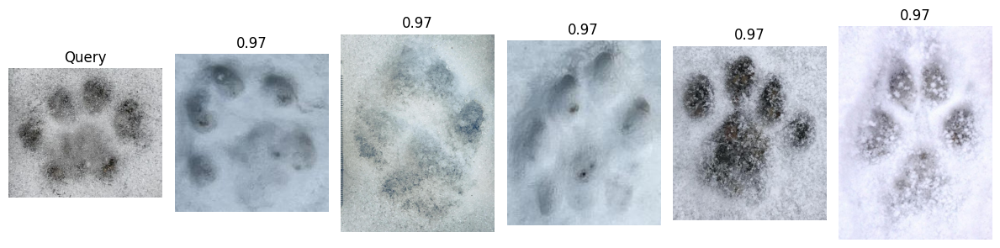


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_038/301223_0_jpg.rf.ec5f5896cb7e47780f824ce71123ed36_3.jpg
Top-5 retrieved:
  sim=0.9571  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_029/39135107_0_jpeg.rf.95252333cab6027b5318783061d345d3_2.jpg
  sim=0.9541  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_061/113268783_0_jpeg.rf.9e7b30f633cdb2f24a0e9ba3adf3017d_1.jpg
  sim=0.9510  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_010/206381046_0_jpg.rf.2404250cdce3052675298557ddbbfd24_1.jpg
  sim=0.9506  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_027/298299_0_jpg.rf.ccef3b1aba2e76a08f709c6216c2ec8c_0.jpg
  sim=0.9500  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_106/1175755_0_jpg.rf.e2e2d1177d1223daae13ca100f6776ea_2.jpg


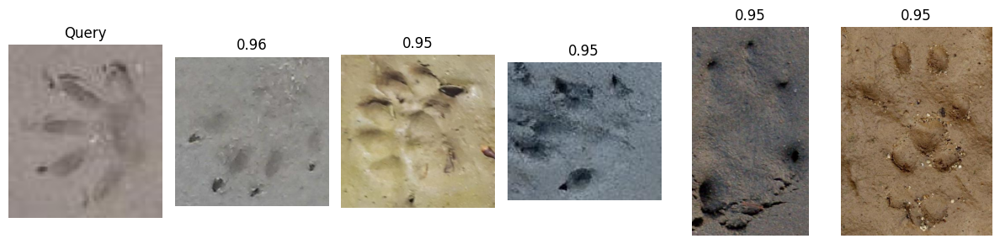


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_055/56782451_0_jpeg.rf.6dbbbb34aaa12b646824b011f6a21752_0.jpg
Top-5 retrieved:
  sim=0.9738  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_002/532167_0_jpg.rf.342db14979848aeebd0fab3c319fc3ab_0.jpg
  sim=0.9531  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_079/40560027_0_jpeg.rf.7e9c9123ddde8fb61707dbd5aff1d7d8_3.jpg
  sim=0.9513  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_000/7820769_0_jpg.rf.a1e5c6860ba5b3e35c62e14160f12ba0_0.jpg
  sim=0.9497  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_010/71518083_0_jpg.rf.b05003f2516ca3a09205d1988996a130_1.jpg
  sim=0.9482  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_023/144659888_0_jpeg.rf.327ce3d616aa28851c3d40f3fc0ce8c4_0.jpg


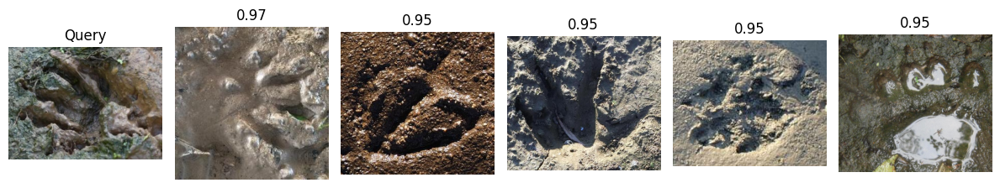


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_029/41636517_0_jpg.rf.86ec5f804dc4f636ff94ccf6ec379f12_0.jpg
Top-5 retrieved:
  sim=0.9816  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_070/35727044_0_jpg.rf.37e9591c7d1a2c0ae1b4ee221826a408_2.jpg
  sim=0.9813  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_019/189361470_0_jpg.rf.481256f5416882d230844c7b6164ab71_1.jpg
  sim=0.9802  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_081/48724824_0_jpg.rf.6c77933cff2827a5c6e0fb20b9aec0d0_1.jpg
  sim=0.9800  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_043/10372534_0_jpg.rf.c625cef871a6bb823bfd6e6bfe7e0794_6.jpg
  sim=0.9754  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_007/85255054_0_jpg.rf.78d72a71022245259162adfbf81afd4b_3.jpg


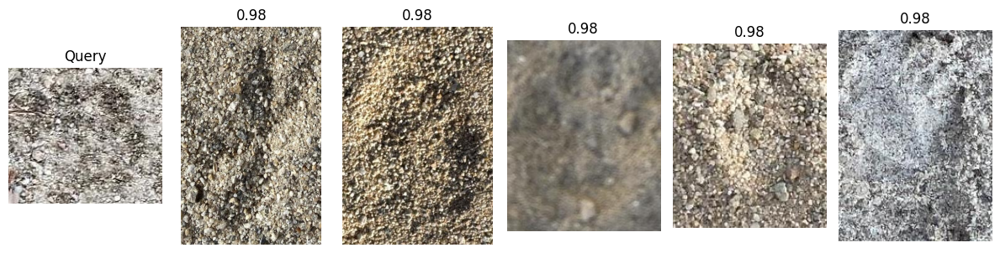


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_116/29139910_0_jpg.rf.cb2482f4847ddff07bbf55bc37c51912_1.jpg
Top-5 retrieved:
  sim=0.9723  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_007/97284086_0_jpg.rf.9648260d95ea0f82b39b42d26d182c46_0.jpg
  sim=0.9590  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_004/27159740_0_jpg.rf.86308161b20955de39b5c4e767a77266_0.jpg
  sim=0.9579  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_065/37689001_0_jpeg.rf.f5e6c2a84e5d1e6b91722ce4c4f1e7d6_1.jpg
  sim=0.9521  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_012/3284735_0_jpg.rf.df6239c15717214b27e9bc0191ff9343_0.jpg
  sim=0.9503  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_061/167326578_0_jpeg.rf.88c31be3c27b6499c5cdacbb2bb6bdb7_0.jpg


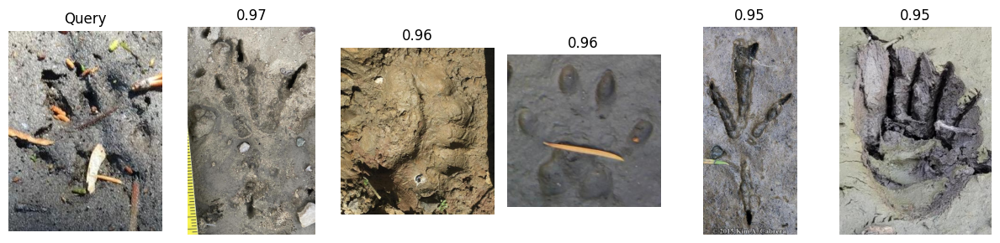


[cnn] done.

[resnet50] EVALUATION START
Loaded 12575 images from /users/PAS2985/tingle9/dataset/footprint_patches/train, 117 classes.
Loaded 3831 images from /users/PAS2985/tingle9/dataset/footprint_patches/test, 117 classes.
loaded [resnet50] contrastive encoder.
[resnet50] encoding TRAIN/TEST features...


[resnet50] encoder kNN Top-1 : 0.0838
loaded [resnet50] alignment heads


[resnet50] token Top-1: 0.0974 (random=0.0085, x11.4)
[resnet50] Retrieval examples (encoder features)...

------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_040/303689_0_jpg.rf.80095145e25bb33da5e0d763470c7c14_0.jpg
Top-5 retrieved:
  sim=0.9634  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_065/295532_0_jpg.rf.06841a2f77fbe2565ef9a1e82ba408ab_7.jpg
  sim=0.9544  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_065/295532_0_jpg.rf.06841a2f77fbe2565ef9a1e82ba408ab_9.jpg
  sim=0.9322  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_099/52676679_0_jpg.rf.5e01549a2280d2d8fc8f9b5d77c2ae77_1.jpg
  sim=0.9297  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_065/295532_0_jpg.rf.06841a2f77fbe2565ef9a1e82ba408ab_2.jpg
  sim=0.9197  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_065/295532_0_jpg.rf.06841a2f77fbe2565ef9a1e82ba408ab_11.jpg


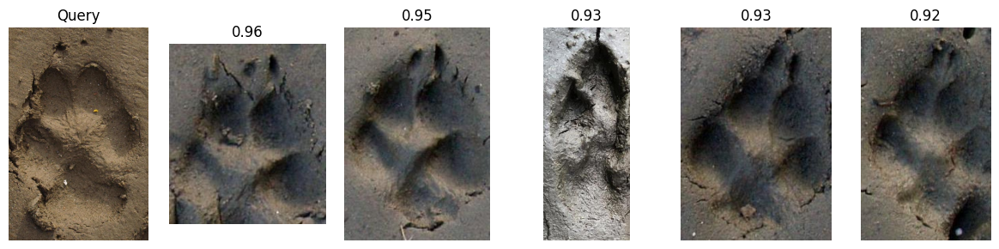


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_032/21257312_0_jpg.rf.0de29d7ef3c8e1d5994b232c0d03c3d2_0.jpg
Top-5 retrieved:
  sim=0.9490  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_051/39448767_0_jpg.rf.550cffd916b053f3c5a2acb488dd8432_4.jpg
  sim=0.9162  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_066/36919868_0_jpg.rf.1b24224aca147a09ab6970839687b04e_0.jpg
  sim=0.9133  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_035/36875587_0_jpg.rf.cdffcce1613e1076d5440ae7b25f8573_0.jpg
  sim=0.9011  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_113/476705_0_jpg.rf.5424f70d46e9a0a4acd6e40f5660bb6d_0.jpg
  sim=0.9009  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_085/19899430_0_jpg.rf.ae0da28a3a4fb44dfd6ff15e950f663b_2.jpg


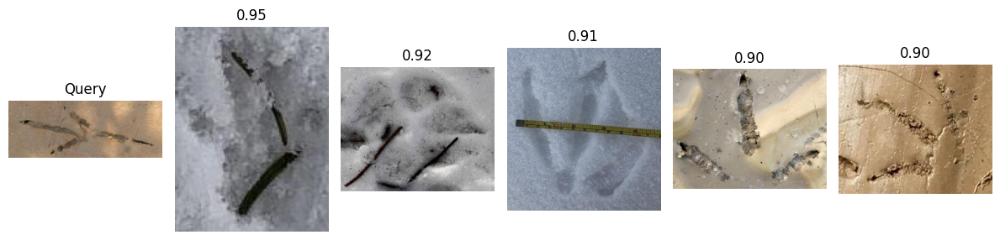


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_030/59854214_0_jpg.rf.68f5b3c5a436f0fdb52fb050fa0fd24e_0.jpg
Top-5 retrieved:
  sim=0.9204  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_038/64675815_0_jpg.rf.82e4362a98a6700a24ad787bf9ed3cd1_0.jpg
  sim=0.9109  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_068/32494585_0_jpg.rf.2393c7ae4d4dc4324e062c3adb7fef35_1.jpg
  sim=0.9102  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_041/178239595_0_jpg.rf.bbe5a68bb978c76e4653001a7f2eec82_0.jpg
  sim=0.9050  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_113/452185_0_jpg.rf.9d929f51f7e87cc8ede94fefcd6979e5_0.jpg
  sim=0.9024  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_042/30463373_0_jpg.rf.8e464a4ae6d1d5385c600b37d9642837_11.jpg


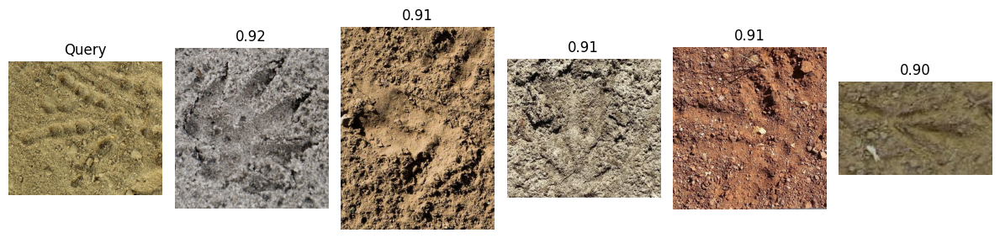


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_025/46427152_0_jpg.rf.fecc9ef815bd16e24bd5276454abe813_0.jpg
Top-5 retrieved:
  sim=0.9581  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_025/46423686_0_jpg.rf.20157d112a148c5997b7765c46b35b56_0.jpg
  sim=0.9575  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_025/46427127_0_jpg.rf.8fbc0c1591a3bb57c607fa763c0811f1_0.jpg
  sim=0.9016  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_025/46424475_0_jpg.rf.41f7427ac2bded1a11bb529ab623a638_0.jpg
  sim=0.8965  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_025/46424442_0_jpg.rf.b913fd3528f04f7d3edbe3d0a9affbd1_0.jpg
  sim=0.8964  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_095/148439413_0_jpeg.rf.8f26bbe2bbdd6ea1da717715003992c8_3.jpg


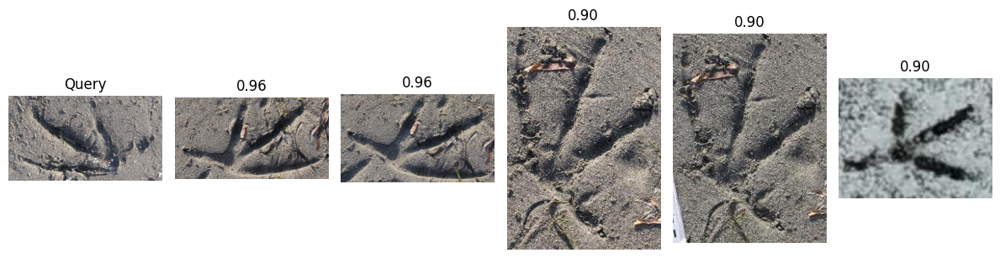


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_090/46167874_0_jpg.rf.244d9930d9cd67fbc9afb7bd5978941d_0.jpg
Top-5 retrieved:
  sim=0.9402  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_101/37631789_0_jpeg.rf.021ea7f2a3648e9e07b68bf92ad17722_0.jpg
  sim=0.9331  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_101/1199593_0_jpg.rf.e8c68067a85b6724686cccdaf8656f36_1.jpg
  sim=0.9212  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_109/1026370_0_jpg.rf.33f27e6a43b69627e17ba3f33f13e190_3.jpg
  sim=0.9203  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_101/1199593_0_jpg.rf.e8c68067a85b6724686cccdaf8656f36_2.jpg
  sim=0.9196  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_093/86791827_0_jpg.rf.05e4d17fb8b29c3e5a579e4ff9f2f474_1.jpg


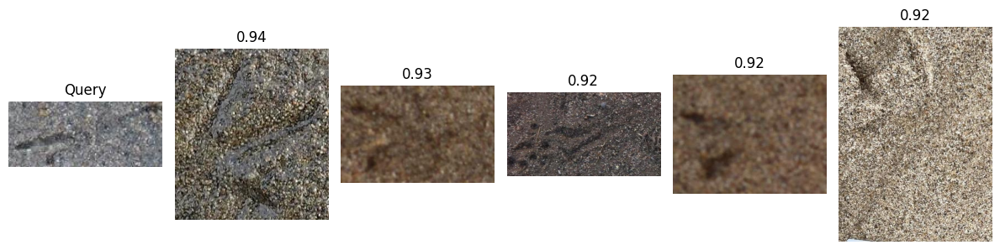


[resnet50] done.

[vgg16] EVALUATION START
Loaded 12575 images from /users/PAS2985/tingle9/dataset/footprint_patches/train, 117 classes.
Loaded 3831 images from /users/PAS2985/tingle9/dataset/footprint_patches/test, 117 classes.
loaded [vgg16] contrastive encoder.
[vgg16] encoding TRAIN/TEST features...


[vgg16] encoder kNN Top-1 : 0.0726
loaded [vgg16] alignment heads


[vgg16] token Top-1: 0.0948 (random=0.0085, x11.1)
[vgg16] Retrieval examples (encoder features)...

------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_088/62024994_0_jpg.rf.b4bccea0232801d46d12439dd8d7d24f_1.jpg
Top-5 retrieved:
  sim=0.8851  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_022/27750265_0_jpg.rf.1ca987567f5db0d7f2234ea7872c14e4_1.jpg
  sim=0.8700  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_007/37512604_0_jpg.rf.39600fe71153b462ca7f5d43200100f9_0.jpg
  sim=0.8661  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_081/43207784_0_jpg.rf.153ffe5c29701383bfb547b7992d373b_1.jpg
  sim=0.8660  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_050/188612571_0_jpeg.rf.aff4b2639f2aafa50e96943c6a63f92f_6.jpg
  sim=0.8659  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_108/901379_0_jpg.rf.3a42f201108dfa19130f4a7fb8e2a574_1.jpg


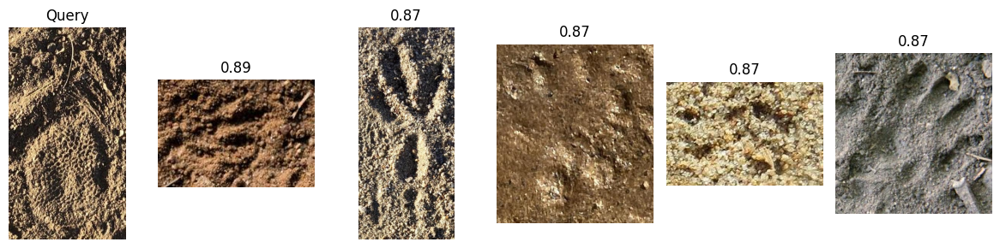


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_099/70716812_0_jpg.rf.d0e7d0faa282a24afc2e73fab09331f2_2.jpg
Top-5 retrieved:
  sim=0.9563  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_078/9180408_0_jpeg.rf.6d3a20d5e7afc6f2bc63b841df14a96e_1.jpg
  sim=0.9425  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_114/73249900_0_jpeg.rf.dba3c9e1f5c91234d385d5516ae5aa7e_4.jpg
  sim=0.9424  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_114/73249900_0_jpeg.rf.dba3c9e1f5c91234d385d5516ae5aa7e_2.jpg
  sim=0.9394  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_063/5018837_0_jpg.rf.e39e656729da681169b2c0622909977b_0.jpg
  sim=0.9377  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_021/143068429_0_jpeg.rf.a9864d308dc23baf41ed2a04e060e446_0.jpg


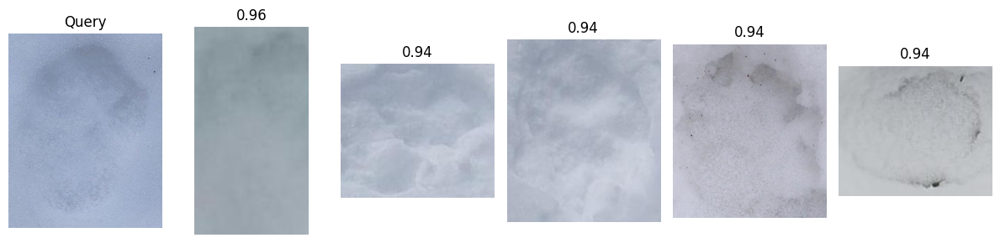


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_094/105459916_0_jpeg.rf.70ca379c38093eca93fcbd3a2b9b2f9c_2.jpg
Top-5 retrieved:
  sim=0.8843  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_089/1061349_0_jpg.rf.5561fe5fd89ce65b0fea56c555713870_1.jpg
  sim=0.8635  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_076/102534179_0_jpg.rf.888c489f3125c32d2981ee12c8d57937_0.jpg
  sim=0.8634  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_001/293573_0_jpg.rf.1a56902063ee76c9f64bab5063ff569b_0.jpg
  sim=0.8613  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_038/190882001_0_jpeg.rf.c347caffe9bfb3b20939c0741331f970_0.jpg
  sim=0.8559  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_045/13205346_0_jpeg.rf.1f0f7b54538df6fe98e4b67ae1cf0b65_1.jpg


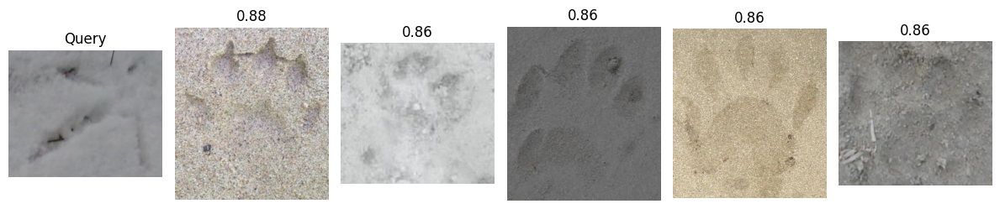


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_010/9606923_0_jpg.rf.31ad78dbced6dd888015869bc3a1dce4_1.jpg
Top-5 retrieved:
  sim=0.8903  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_062/172588492_0_jpg.rf.7ea024e04cb089bdf6db12efa73a7e91_0.jpg
  sim=0.8803  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_089/9052949_0_jpeg.rf.73f706fe49f839e5dee696a9ea218e12_0.jpg
  sim=0.8751  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_029/40002082_0_jpeg.rf.0f95b514be3d48f62f75cff7b2a20bc6_1.jpg
  sim=0.8715  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_081/56433458_0_jpg.rf.4403b5509fcc850afaafa62d052e24c1_0.jpg
  sim=0.8692  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_004/142562057_0_jpg.rf.6a0e671d387139c9870b34d3a916e2b3_0.jpg


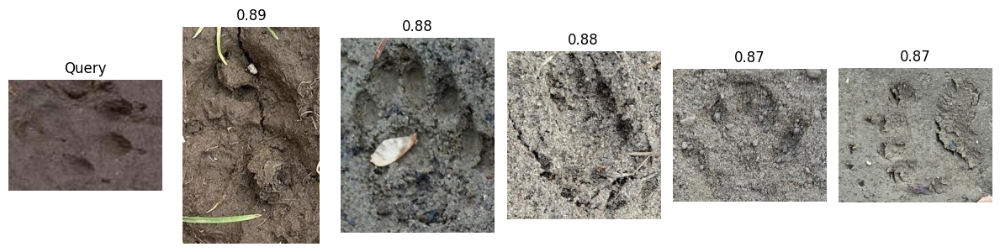


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_038/301223_0_jpg.rf.ec5f5896cb7e47780f824ce71123ed36_1.jpg
Top-5 retrieved:
  sim=0.8748  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_084/104420089_0_jpeg.rf.a5028c0d10751b04edf0bfd014228605_0.jpg
  sim=0.8605  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_002/293574_0_jpg.rf.545a3a26fd4548790b345a9edcb9a2e1_0.jpg
  sim=0.8529  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_060/150597058_0_jpeg.rf.50afc76f2f39302413b8bc8ce3f3363b_5.jpg
  sim=0.8510  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_049/136222021_0_jpeg.rf.2bc234063261dde39ddac87284e8b59b_2.jpg
  sim=0.8497  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_027/117056378_0_jpeg.rf.1beb54555ec7b8d32355b49260853b78_0.jpg


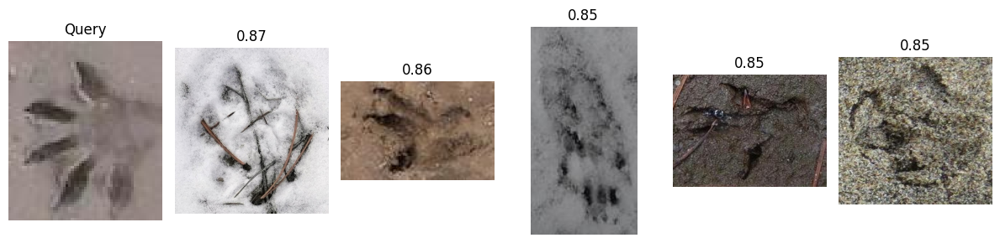


[vgg16] done.

[vit_b_16] EVALUATION START
Loaded 12575 images from /users/PAS2985/tingle9/dataset/footprint_patches/train, 117 classes.
Loaded 3831 images from /users/PAS2985/tingle9/dataset/footprint_patches/test, 117 classes.
loaded [vit_b_16] contrastive encoder.
[vit_b_16] encoding TRAIN/TEST features...


[vit_b_16] encoder kNN Top-1 : 0.0467
loaded [vit_b_16] alignment heads


[vit_b_16] token Top-1: 0.0538 (random=0.0085, x6.3)
[vit_b_16] Retrieval examples (encoder features)...

------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_028/18636776_0_jpg.rf.61e0a40d184683a8314efadbc28e70b8_12.jpg
Top-5 retrieved:
  sim=0.9986  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_028/194475356_0_jpg.rf.fcc6f4b32f6d3d7aafcff0280f4b6b72_4.jpg
  sim=0.9972  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_067/51856128_0_jpg.rf.9cac13e4ad881070a18cc9025a071bf4_0.jpg
  sim=0.9969  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_038/180666599_0_jpg.rf.1977e4ec21a9b4bcb7c05a64184e56a2_1.jpg
  sim=0.9966  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_031/104274686_0_jpg.rf.5b6a326c97def562cea9df813b7b6743_3.jpg
  sim=0.9960  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_084/139391045_0_jpg.rf.ff6e7f6502c4e6fc9ee846392c01fe3a_0.jpg


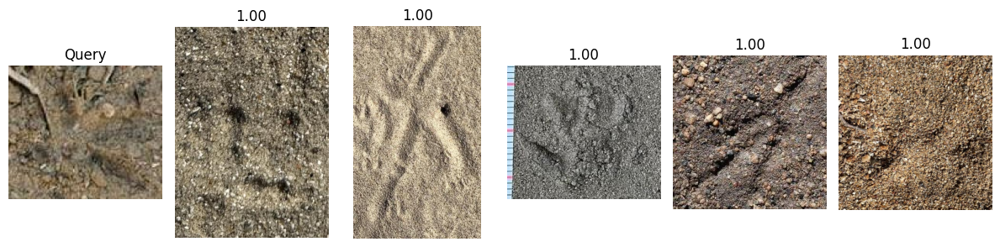


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_029/41144986_0_jpg.rf.a70c56c6c89bd52981f3e679f0ed8cca_1.jpg
Top-5 retrieved:
  sim=0.9946  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_041/703806_0_jpg.rf.b31f6943a73bde7ac8d79c13dac3981f_3.jpg
  sim=0.9936  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_104/306105_0_jpg.rf.9a3bd2d43600b2ddd2c842861eb2475b_9.jpg
  sim=0.9920  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_010/10106249_0_jpg.rf.b9149d9361e826455658f3d19a2dacd7_3.jpg
  sim=0.9913  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_064/759337_0_jpg.rf.5d6aa6c8ac79c76ddfd8e128eee720cc_0.jpg
  sim=0.9911  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_021/102438525_0_jpg.rf.2fd66d7e13c4dc186c1f4a2a9f859886_0.jpg


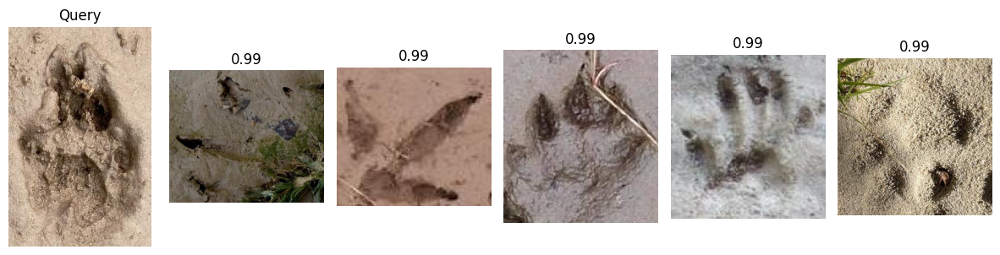


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_113/102762501_0_jpg.rf.06bdbbce7ed1ad2af8921946fbe2a9fd_1.jpg
Top-5 retrieved:
  sim=0.9927  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_081/110066619_0_jpg.rf.84cb473fe447eb46721e77b31b795895_2.jpg
  sim=0.9904  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_084/93536162_0_jpg.rf.b7905d861d1feb954f2a0ecec92a7f79_0.jpg
  sim=0.9892  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_051/39448767_0_jpg.rf.550cffd916b053f3c5a2acb488dd8432_1.jpg
  sim=0.9883  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_045/47685346_1_jpg.rf.46006cb461499c3b2709ac633c037016_1.jpg
  sim=0.9883  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_106/19689798_0_jpg.rf.57b2fe3b710790fd893ec13bbc008c1d_3.jpg


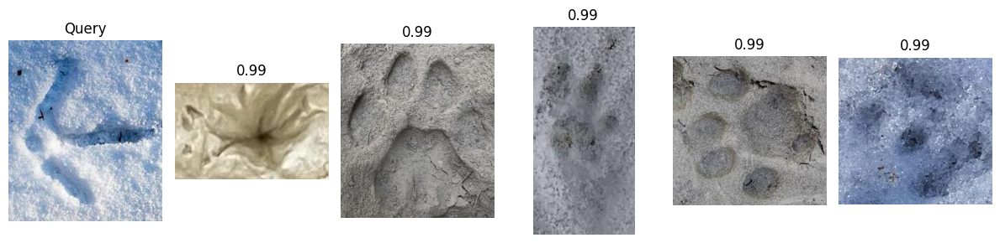


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_088/2647235_0_jpg.rf.b9dfb460de289265824584aeb0bb0041_1.jpg
Top-5 retrieved:
  sim=0.9861  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_060/108185466_0_jpeg.rf.60d12d55d71d2842ead7ca61b4fac2b5_21.jpg
  sim=0.9852  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_009/105629801_0_jpg.rf.ff4e25eff7d57e1f130d68bda3b1f779_11.jpg
  sim=0.9849  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_060/65743252_0_jpeg.rf.a92bf32acdcc44d3f9e472ed8efa9723_0.jpg
  sim=0.9841  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_060/148963121_0_jpeg.rf.8f53bf8baf80f334892cb4c11f5b5c1d_1.jpg
  sim=0.9797  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_073/144975391_0_jpeg.rf.7d758683f35130be1f6631f461da11f7_0.jpg


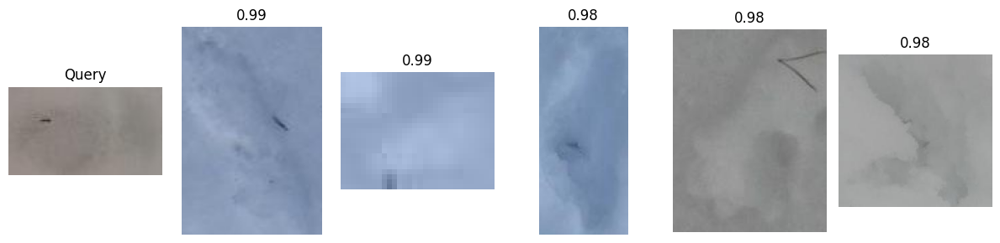


------------------------------
Query: /users/PAS2985/tingle9/dataset/footprint_patches/test/species_044/39315797_0_jpg.rf.0a7f24eba7cccb056bf8d2da66702ed2_1.jpg
Top-5 retrieved:
  sim=0.9964  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_037/856459_0_jpg.rf.11ea6b28f1d6fba2243819a19c2b9abb_4.jpg
  sim=0.9962  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_103/757381_0_jpg.rf.5a1783265c96a1bfa302aac483dc8836_1.jpg
  sim=0.9958  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_084/141805314_0_jpeg.rf.bfc53ec8c2182c2aa05ff83f96caba95_1.jpg
  sim=0.9956  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_042/89336156_0_jpg.rf.1ed357318767be1c9aabe7ecafa2a5bf_1.jpg
  sim=0.9953  /users/PAS2985/tingle9/dataset/footprint_patches/train/species_072/3494200_0_jpeg.rf.2af348746a5954da2eb2a58c7d1e3890_0.jpg


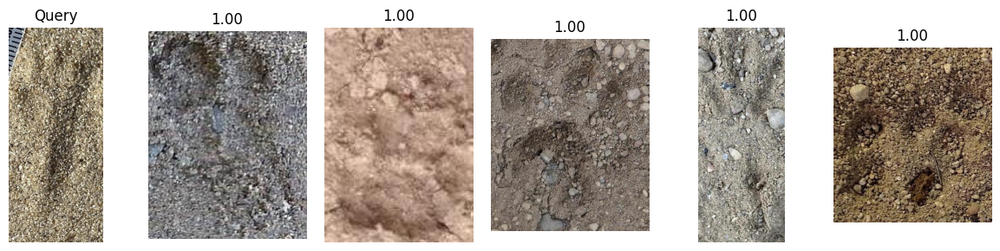


[vit_b_16] done.


In [18]:
def main():
    torch.set_grad_enabled(False)

    backbones = ["cnn", "resnet50", "vgg16", "vit_b_16"]
    batch_size = 64
    num_workers = 8
    run_retrieval_demo = True

    print("Device:", DEVICE)

    for backbone in backbones:
        print("\n" + "=" * 80)
        print(f"[{backbone}] EVALUATION START")
        print("=" * 80)

        # 1) loader / dataset
        train_ds, test_ds, train_loader, test_loader, num_classes = build_loaders(
            backbone, batch_size=batch_size, num_workers=num_workers
        )

        # 2) contrastive encoder load + embedding
        encoder = load_contrastive_encoder_for_eval(backbone, DEVICE)

        print(f"[{backbone}] encoding TRAIN/TEST features...")
        train_feats, train_labels, train_paths = compute_encoder_embeddings(
            encoder, train_loader, DEVICE, dataset=train_ds
        )
        test_feats, test_labels, test_paths = compute_encoder_embeddings(
            encoder, test_loader, DEVICE, dataset=test_ds
        )
        
        # 3) encoder-only kNN Top-1
        knn1 = knn_top1(test_feats, test_labels, train_feats, train_labels, k=1)
        print(f"[{backbone}] encoder kNN Top-1 : {knn1:.4f}")

        # 4)  token Top-1
        img_proj, txt_enc = load_alignment_heads(
            backbone,
            num_classes=num_classes,
            encoder_out_dim=encoder.out_dim,
            device=DEVICE,
        )
        if img_proj is not None:
            token_top1 = evaluate_token_top1(encoder, img_proj, txt_enc, test_loader, DEVICE)
            rand = 1.0 / num_classes
            print(f"[{backbone}] token Top-1: {token_top1:.4f} "
                  f"(random={rand:.4f}, x{token_top1 / rand:.1f})")

        # 5) retrieval
        
        if run_retrieval_demo:
            print(f"[{backbone}] Retrieval examples (encoder features)...")

            num_queries = 5
            all_indices = list(range(len(test_paths)))
            rand_indices = random.sample(all_indices, num_queries)

            for qi in rand_indices:
                q_path = test_paths[qi]
                q_feat = test_feats[qi:qi+1]  # (1, D)

                retrieved = retrieve_topk(q_feat, train_feats, train_paths, k=5)

                print("\n------------------------------")
                print("Query:", q_path)
                print("Top-5 retrieved:")
                for p, s in retrieved:
                    print(f"  sim={s:.4f}  {p}")

                show_retrieval_row(q_path, retrieved, cols=6)

        print(f"\n[{backbone}] done.")
        
main()